# R SITS Land Use Classification

* **Products used:** 
[s2_l2a](https://explorer.digitalearth.africa/s2_l2a)

## Background

Digital Earth Africa imagery is supported by the R software package [SITS](https://github.com/e-sensing/sits) - Satellite Image Time Series Analysis for Earth Observation Data Cubes. The package provides a wide range of functions for processing and analysing satellite derived data cubes. 

The `s2_l2a` product is currently supported, with [loading details](https://e-sensing.github.io/sitsbook/earth-observation-data-cubes.html#assessing-digital-earth-africa) provided in the [SITS e-book](https://e-sensing.github.io/sitsbook/index.html).

This notebook gives a demonstration of loading and using Digital Earth Africa's `s2_l2a` product for an introductory land use classification workflow.

**Important details:**

* R programming language
    * This notebook must be run with the R programming language. Ensure you are using an R-enabled environment and select and R kernel (top-right of Jupyter environment).


## Description

This notebook goes through a land use classification workflow via the following steps:
1. Generate a data cube from Digital Earth Africa Sentinel-2 imagery.
2. Bring in training data and draw a timeseries of band values from the data cube.
3. Run a land use classification algorithm using machine learning techniques.
4. Inspect the resulting classification for the area of interest.

***

## Getting started

To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell.

This notebook may look and behave slightly differently to what Sandbox users are accustomed to, due to its use of the R programming language.

### Load packages

The cell below loads necessary R packages into a local library with the `lib` argument which can be altered if necessary. Sometimes there can be challenges using the `install.packages` command, in which case packages can be downloaded from source as a .zip file and uploaded directly into the library.

To install the packages, uncomment the commands by removing the `#` character.

In [1]:
#install.packages('tidyverse', lib='~/R/x86_64-pc-linux-gnu-library/4.2')
#install.packages('sits', lib='~/R/x86_64-pc-linux-gnu-library/4.2')
#install.packages('devtools', lib='~/R/x86_64-pc-linux-gnu-library/4.2')

Now we attach the packages using the `library` function.

In [2]:
library(tidyverse, lib='~/R/x86_64-pc-linux-gnu-library/4.2')
library(sits, lib='~/R/x86_64-pc-linux-gnu-library/4.2')

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.2     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
SITS - satellite image time series analysis.

Loaded sits v1.4.1.
        See ?sits for help, citation("sits") for use in publication.
        Documentation avaliable in https://e-sensing.github.io/sitsbook/.



## Load Sentinel-2 data

The `SITS` package supports Digital Earth Africa Sentinel-2 (`s2_l2a`) data in addition to images from the Brazil Data Cube, Amazon Web Servies, Microsoft Planetary Computer, and other sources.

Below, a Sentinel-2 data cube is loaded for an area of Zimbabwe for June - August 2019. The term 'data cube' refers to the same data form that Sandbox users would be familiar with; multi-band data with space and time dimensions. However, cube objects are built from `tibble` format data in the SITS package which draws on the R `tidyverse` packages.

  |======================================================================| 100%


The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 



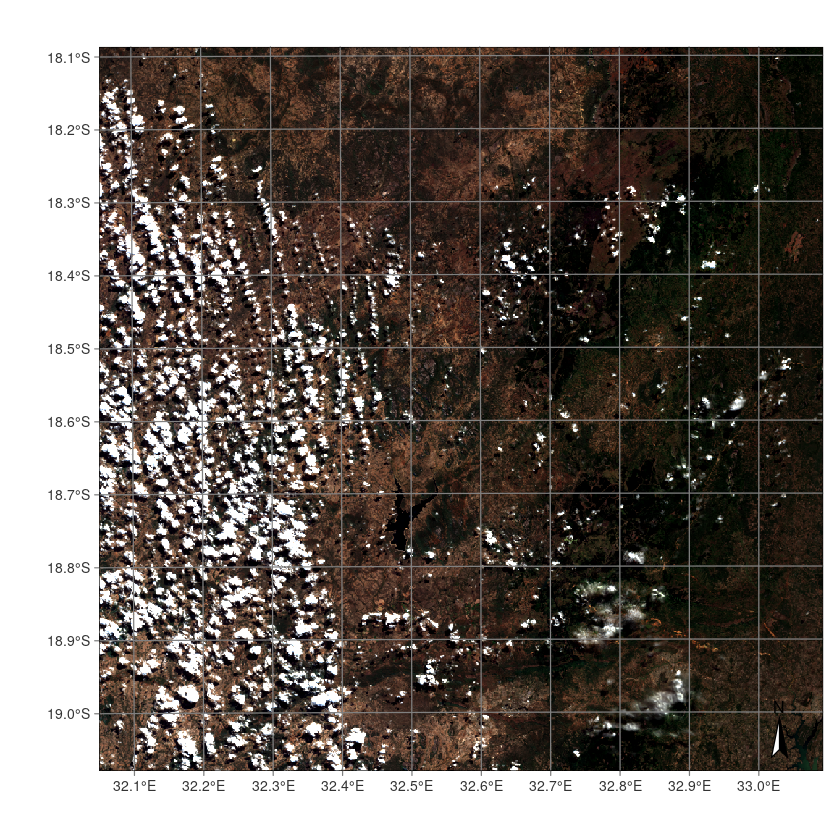

In [3]:
dea_cube <- sits_cube(
  source = "DEAFRICA",
  collection = "S2_L2A",
  roi = c(
    lon_min = 32.87, lat_min = -18.38,
    lon_max = 32.98, lat_max = -18.25
  ),
  bands = c("B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B11", "B12"),
  start_date = "2019-06-01",
  end_date = "2019-09-01"
)
plot(dea_cube, red = "B04", blue = "B02", green = "B03")

The SITS package allows users to regularise data cubes to target spatial and temporal resolution. In this case, we are regularising to a spatial resolution of 60-m using the `res` argument and a period of 15 days with the `period` argument. More information on the `sits_regularize()` function can be found in the [documentation](https://rdrr.io/github/e-sensing/sits/man/sits_regularize.html).

In [4]:
reg_cube <- sits_regularize(
  cube       = dea_cube,
  output_dir = '~/R/cubes',
  res        = 60,
  period     = "P15D",
  multicores = 4
)

Warning message:
“Cloud band not found in provided cube.
                    'sits_regularize()' will just fill nodata values.”


  |======================================================================| 100%


### Calculate NDVI

The `sits_apply()` function allows calculation of spectral indices by defining formulae, as below. The NDVI plot is a nice visualisation that already gives us clues about the land cover classes present in our area of interest.

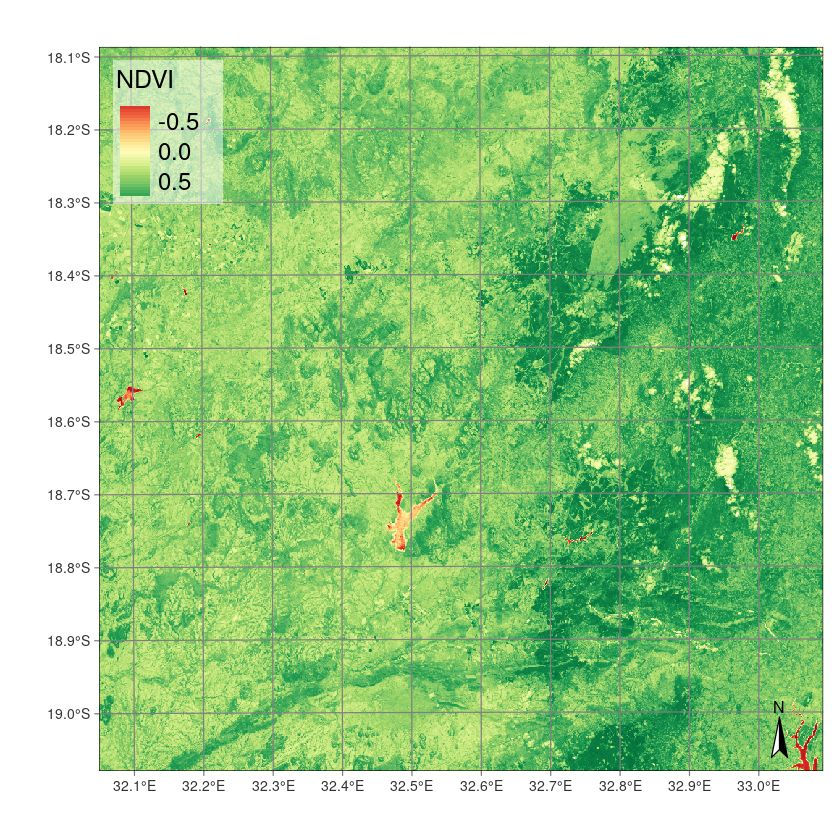

In [5]:
reg_cube <- sits_apply(reg_cube,
  NDVI = (B08 - B04) / (B08 + B04),
  output_dir = '~/R',
  multicores = 4,
  memsize = 12
)
plot(reg_cube, band = "NDVI", color_palette = "RdYlGn")

### Spectral Mixture Analysis

The SITS package has a spectral mixture analysis function which takes inputs defining band values (end members - em) for pure land cover classes, such as forest, soil and water. In reality, pixels may contain a mixture of these classes. The analysis procedure calculates the proportion of each pixel in each land cover class. More information on spectral mixture analysis in SITS can be found in the [e-book](https://e-sensing.github.io/sitsbook/operations-on-data-cubes.html#spectral-mixture-analysis).

The first plot shows the proportion of pixels likely to be occupied by forest, the second shows the same for water, and the third for soil.

  |======================================================================| 100%


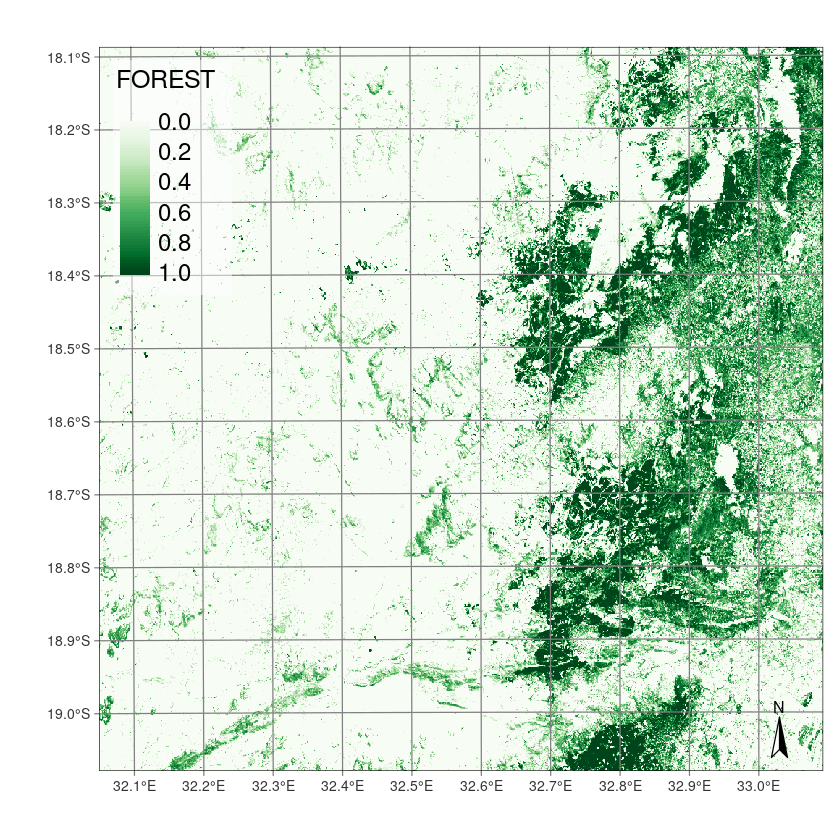

In [6]:
em <- tibble::tribble(
  ~class,   ~B02, ~B03, ~B04, ~B8A, ~B11, ~B12,
  "forest",  200,  352,  189, 2800, 1340,  546,
  "soil",    400,  650,  700, 3600, 3500, 1800,
  "water",   700, 1100, 1400,  850,   40,   26
)
# Generate the mixture model
reg_cube <- sits_mixture_model(
  data = reg_cube,
  endmembers = em,
  multicores = 4,
  memsize = 12,
  output_dir = '~/R'
)
# Plot the FOREST for the first date using the Greens palette
plot(reg_cube, band = "FOREST", color_palette = "Greens")

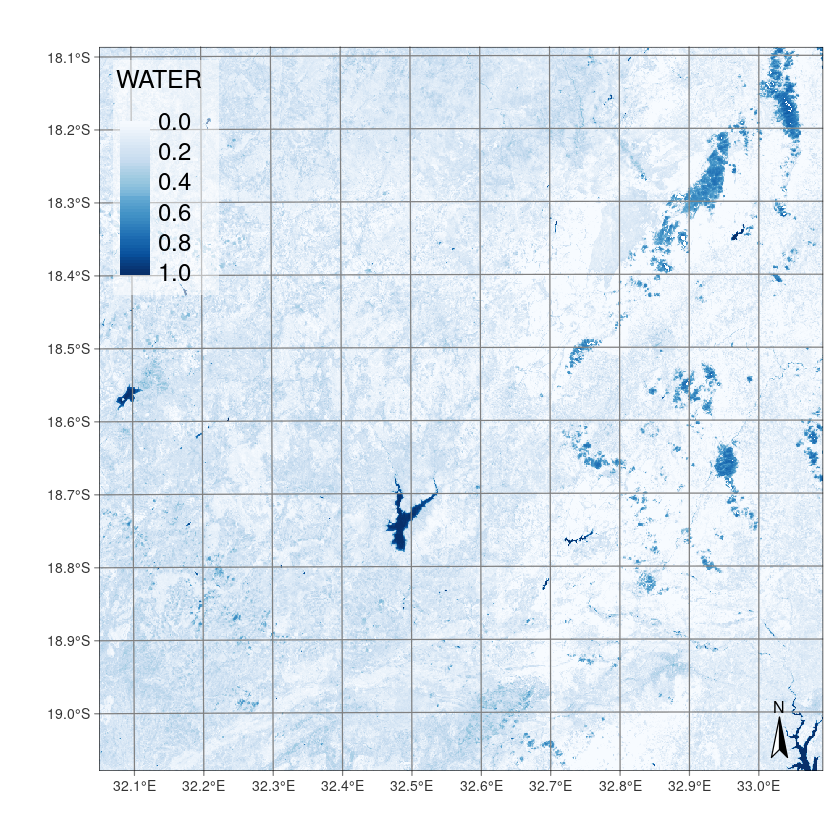

In [7]:
plot(reg_cube, band = "WATER", color_palette = "Blues")

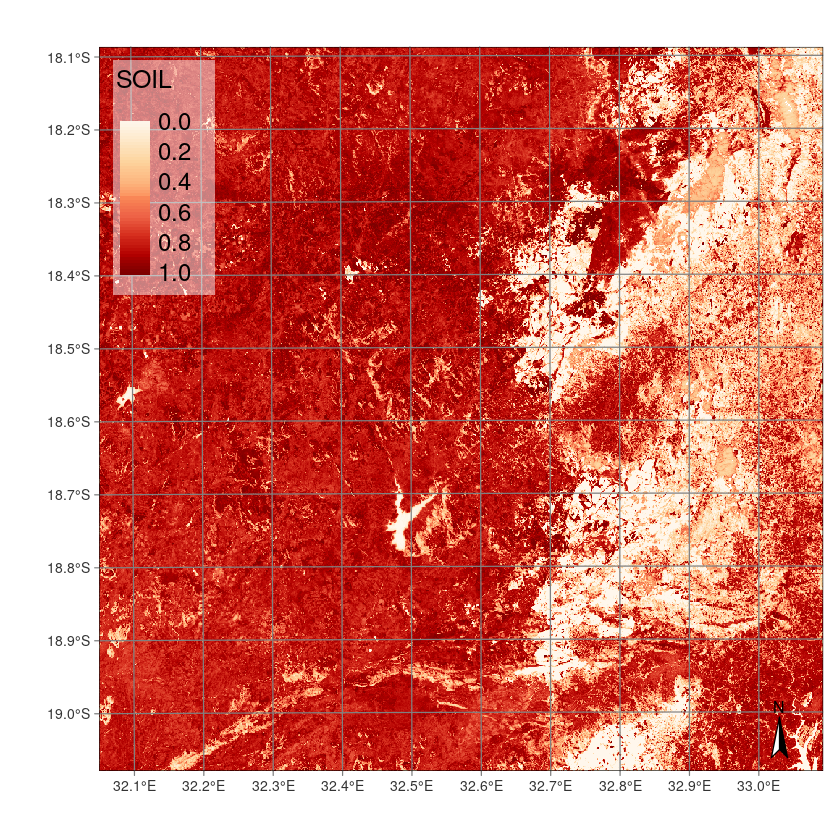

In [8]:
plot(reg_cube, band = "SOIL", color_palette = "OrRd")

## Import training data

To conduct supervised land use classification, we need to have points or polygons with land cover class labels. For this classification, we have a small dataset of labelled longitude and latitude points with start and end dates, corresponding to the satellite data cube, for the area of interest in Zimbabwe.

The cell below generates a timeseries of pixel values for each band (including NDVI and bands from the spectral mixture analysis) in the data cube. This will be used as training data in the land use classification.

In [9]:
series <- sits_get_data(
    cube=reg_cube,
    samples='data/Rsits_Zim.csv')

### Inspect NDVI time series

Band value time series can be inspected for each sample class. The plots below show an NDVI time series for each land cover class Each point is denoted by a blue line. The median is the thick red line, and the two lighter orange lines are the first and third interquartile bounds.

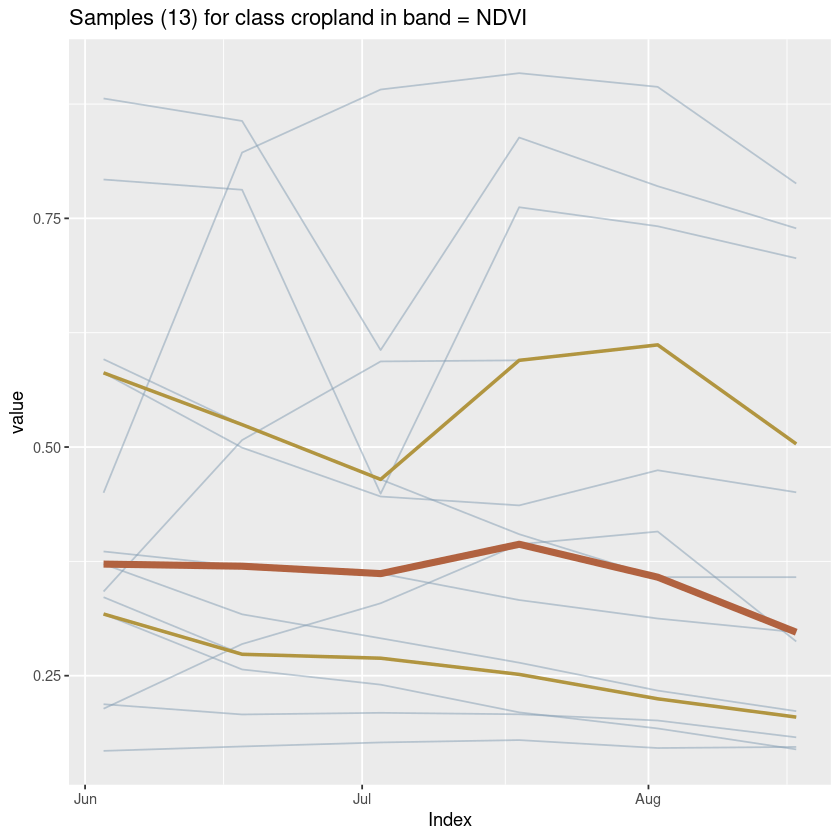

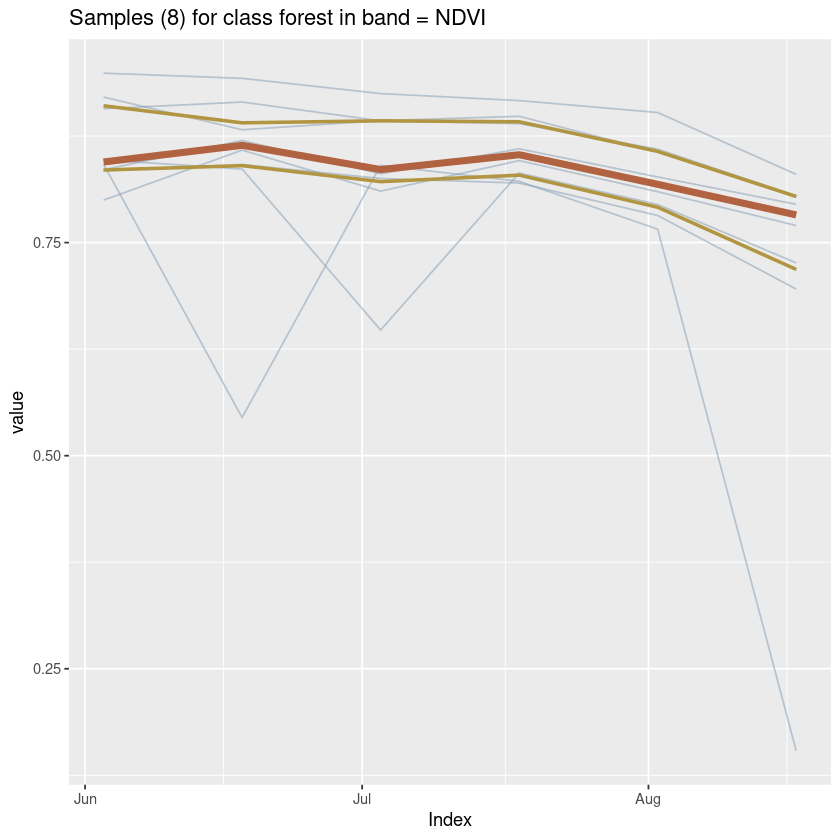

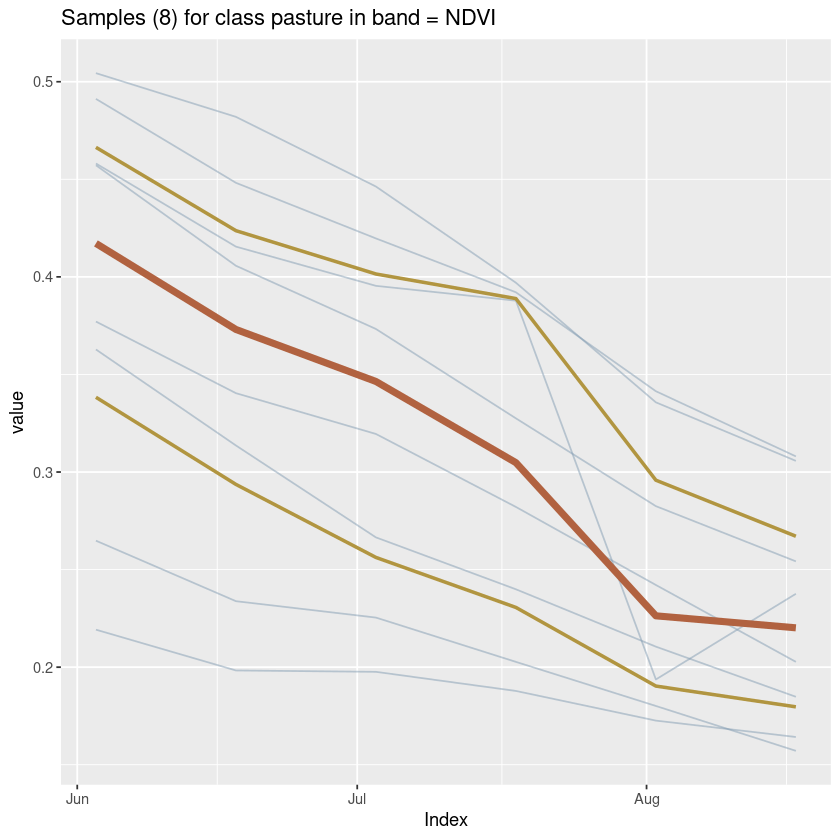

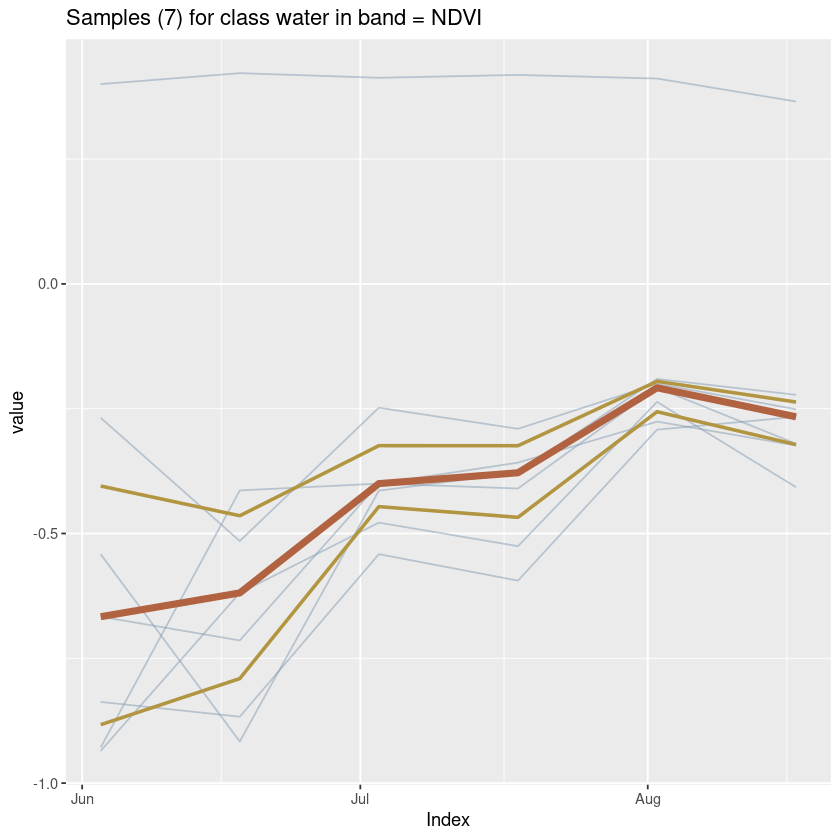

In [10]:
point_ndvi <- sits_select(series, band='NDVI')

plot(point_ndvi)

### Inspect map of training data

The training data can be viewed in space with an interactive plot using `sits_view()`. An intuitive legend is defined.

In [11]:
def_legend <- c("cropland"="lightgreen", "forest"="forestgreen", "pasture"="yellow", "water"="blue")

sits_view(series, legend=def_legend)

HTML widgets cannot be represented in plain text (need html)

### Train classification model

In this case we will train a random forest classification model with 100 trees. SITS supports numerous machine learning algorithms, you can find out more about the options in the [machine learning section](https://e-sensing.github.io/sitsbook/machine-learning-for-data-cubes.html) of the e-book.

In [12]:
rfor_model <- sits_train(
  samples = series,
  ml_method = sits_rfor(num_trees = 100)
)

Once the model is trained, it can be used to classify the entire area of interest; our original data cube. The initial output of the `sits_classify()` command is a probability map of each class in the training dataset. So, in this case we get four maps: cropland, forest, pasture, and water.

Recovery: tile '36KVE' already exists.

(If you want to produce a new image, please change 'output_dir' or 'version' parameters)



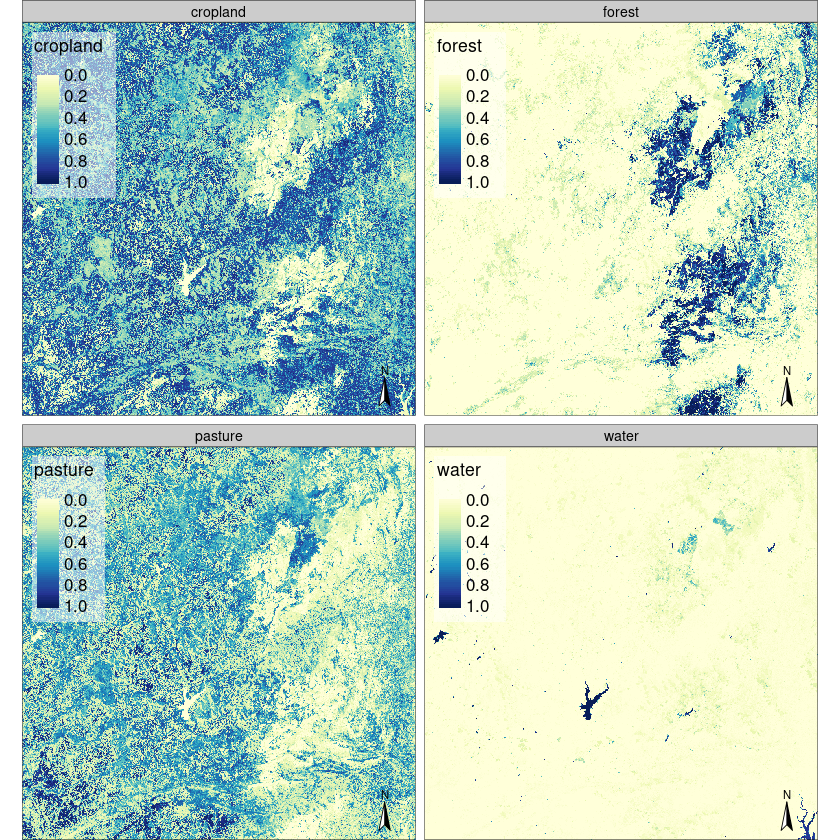

In [13]:
point_class <- sits_classify(
  data = reg_cube,
  ml_model = rfor_model,
  output_dir = 'models'
)
plot(point_class)

We can generate a classification map using the `sits_label_classification()` function which displays all classes on a single map. The legend we defined earlier with intuitive colours is used again here.

Recovery: data '36KVE' already exists.

(If you want to produce a new image, please change 'output_dir' or 'version' parameters)



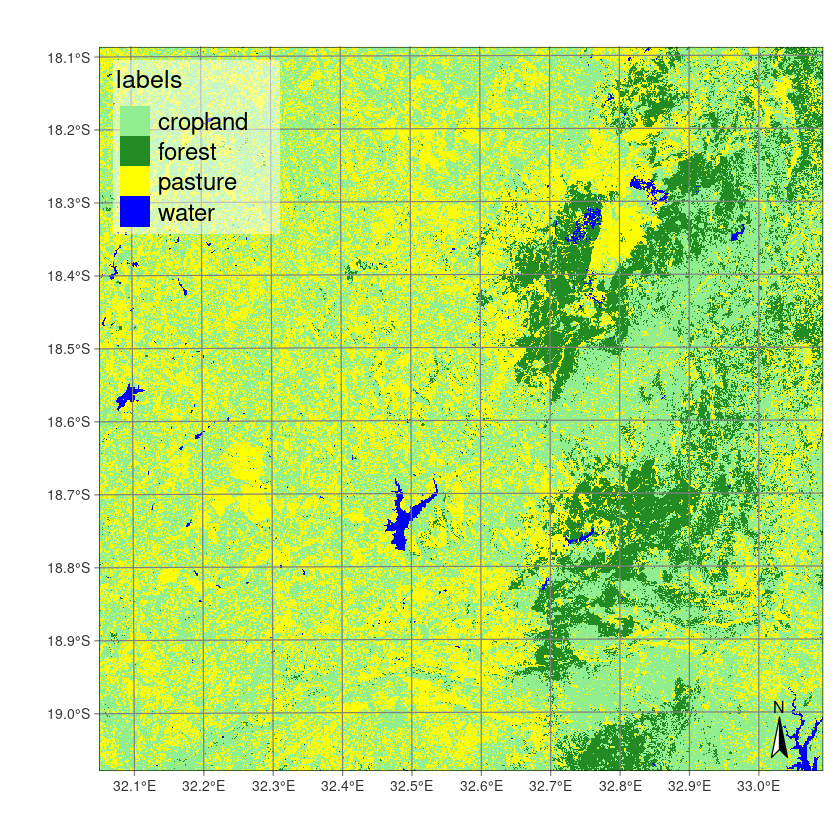

In [14]:
class_map <- sits_label_classification(
    cube=point_class,
    multicores=4,
    memsize=12,
    output_dir = 'models',
    version="no_smooth"
    )

plot(class_map, legend=def_legend)

Similarly, the classification output can be viewed interactively. How do the predicted classes look compared with the true-colour imagery?

HTML widgets cannot be represented in plain text (need html)
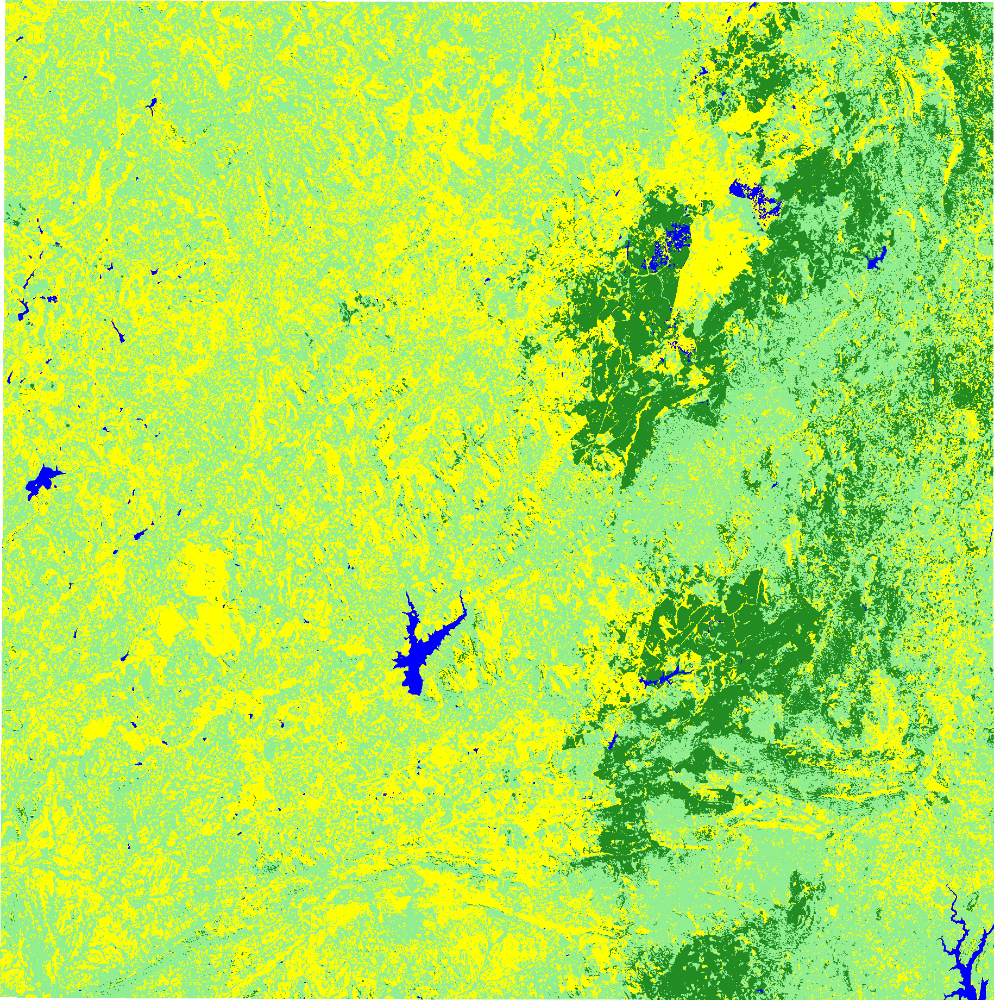

In [15]:
sits_view(class_map, legend=def_legend)

### Smooth the classification outputs

The SITS package has functionality for Bayesian spatial smoothing of outputs, which considers spatial dependence. This post-processing procedure can minimise noise and produce more accurate results. More information is available in the [Bayesian smoothing section](https://e-sensing.github.io/sitsbook/bayesian-smoothing-for-post-processing.html) of the SITS e-book.

Recovery: data '36KVE' already exists.

(If you want to produce a new image, please change 'output_dir' or 'version' parameters)



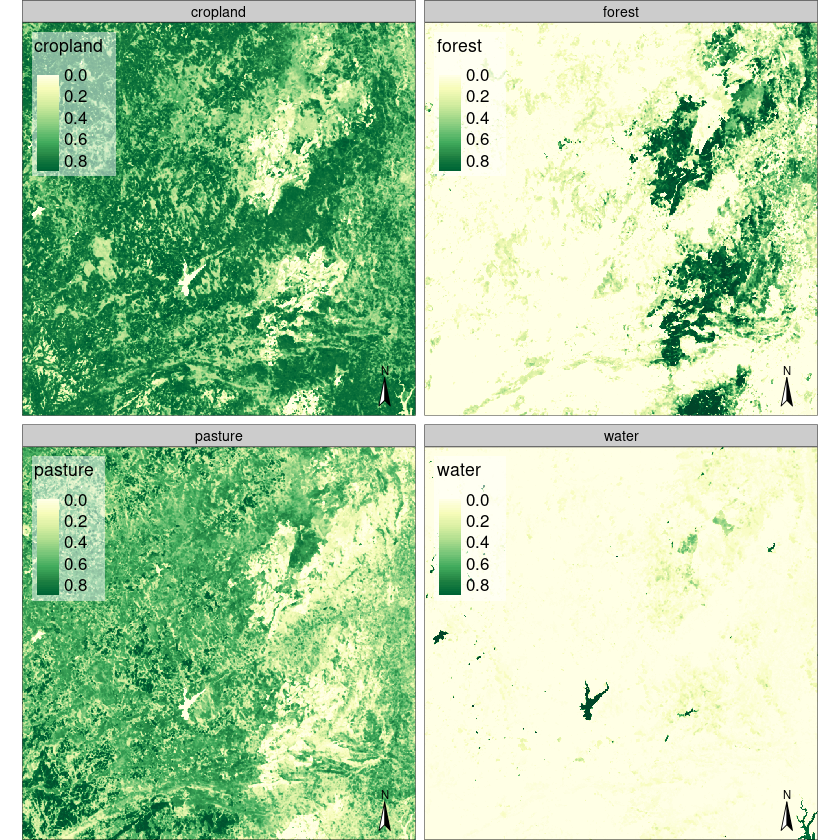

In [16]:
class_map_smooth <- sits_smooth(
    cube=point_class,
    window_size=7,
    neigh_fraction = 0.5,
    smoothness=20,
    multicores=4,
    memsize=12,
    version = "1.0",
    output_dir = 'models'
    )

plot(class_map_smooth, color_palette="YlGn")

Recovery: data '36KVE' already exists.

(If you want to produce a new image, please change 'output_dir' or 'version' parameters)



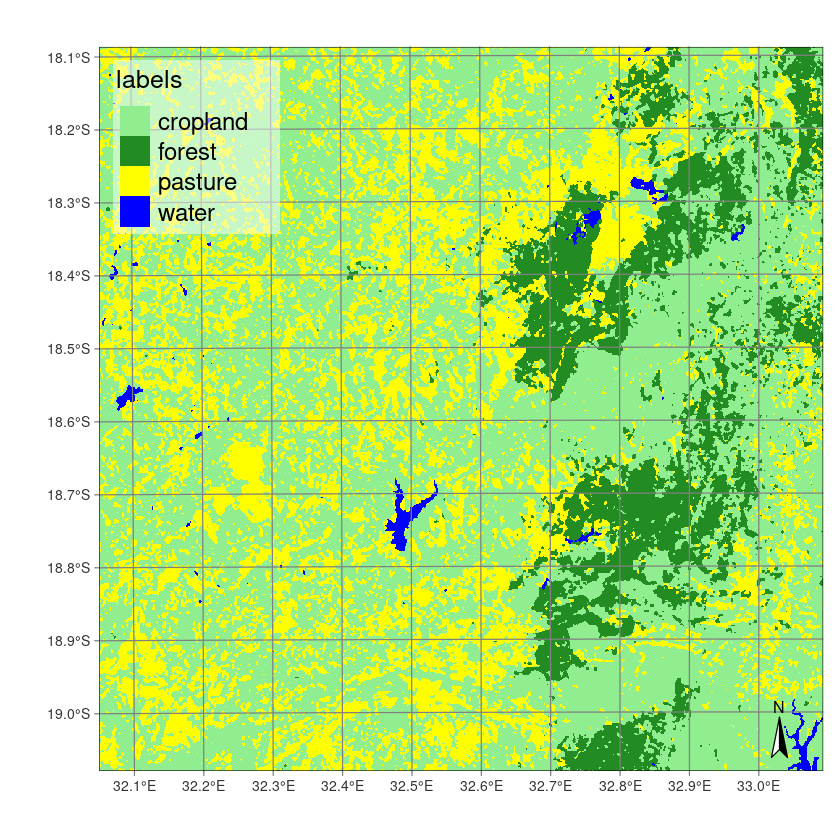

In [17]:
class_map_smooth <- sits_label_classification(
    cube=class_map_smooth,
    multicores=4,
    memsize=12,
    output_dir = 'models',
    version="smooth"
    )

plot(class_map_smooth, legend=def_legend)

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Last Tested:**

In [18]:
now()

[1] "2023-10-12 09:08:03 UTC"